<a href="https://colab.research.google.com/github/elianiva/imgpro-compvis/blob/master/week-5/gamma.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [68]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

# Gamma Effect

 Gamma Correction pada citra 
-----------------------------
Insert gamma value: 3


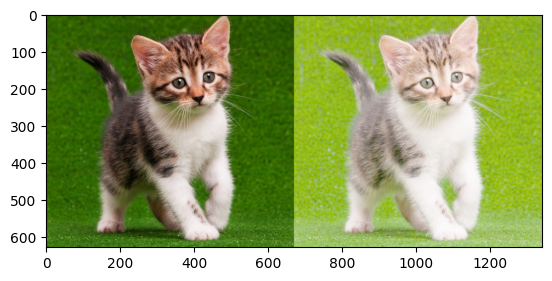

In [2]:
print(' Gamma Correction pada citra ')
print('-----------------------------')

try:
  gamma = int(input('Insert gamma value: '))
except ValueError:
  print('Gamma value must be integer')

img = cv.imread('/content/drive/MyDrive/PCVK/Images/kitten01.jpg')
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
img_with_gamma = np.power(img/255, 1/gamma) * 255
result = cv.hconcat([img, img_with_gamma.astype(np.uint8)])

plt.imshow(result)
plt.show()

# Image Depth

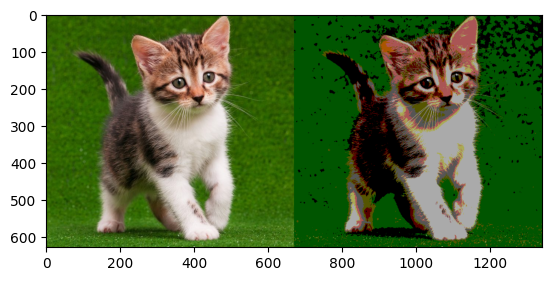

In [3]:
bit_depth = 2
level = 255 / (pow(2, bit_depth) - 1)
img = cv.imread('/content/drive/MyDrive/PCVK/Images/kitten01.jpg')
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
img_depth = np.zeros(img.shape, dtype=np.uint8)

for i in range(img.shape[0]):
  for j in range(img.shape[1]):
    img_depth[i, j] = np.uint8(img[i, j] / level) * level

result = cv.hconcat([img, img_depth])
plt.imshow(result)

# Average Denoising

In [38]:
import glob

def PSNR(img1, img2):
  mse = np.mean((img1/255 - img2/255)**2)
  if mse == 0:
    return 100
  max_pixel = 255.0
  psnr = 20 * np.log10(max_pixel / np.sqrt(mse))
  return psnr

# a function to apply average denoising using however many images specified
# this works by stacking n images and then finding the average of each pixel
def average_denoise(imgs):
  result = np.zeros(imgs[0].shape, dtype=np.float64)
  for img in imgs:
    result += img
  result = result / len(imgs)
  return result.astype(np.uint8)


In [42]:
imgs = [cv.imread(img) for img in glob.glob('/content/drive/MyDrive/PCVK/Images/noises/*.jpg')]
imgs = [cv.cvtColor(img, cv.COLOR_BGR2RGB) for img in imgs]

# create a table with the result of average denoising
avg_count = [5, 10, 20, 40, 80, 100]
result = []
for count in avg_count:
  img = average_denoise(imgs[:count])
  psnr = PSNR(img, imgs[0])
  result.append((img, psnr))

Text(0.5, 0.98, 'Average Denoising Result')

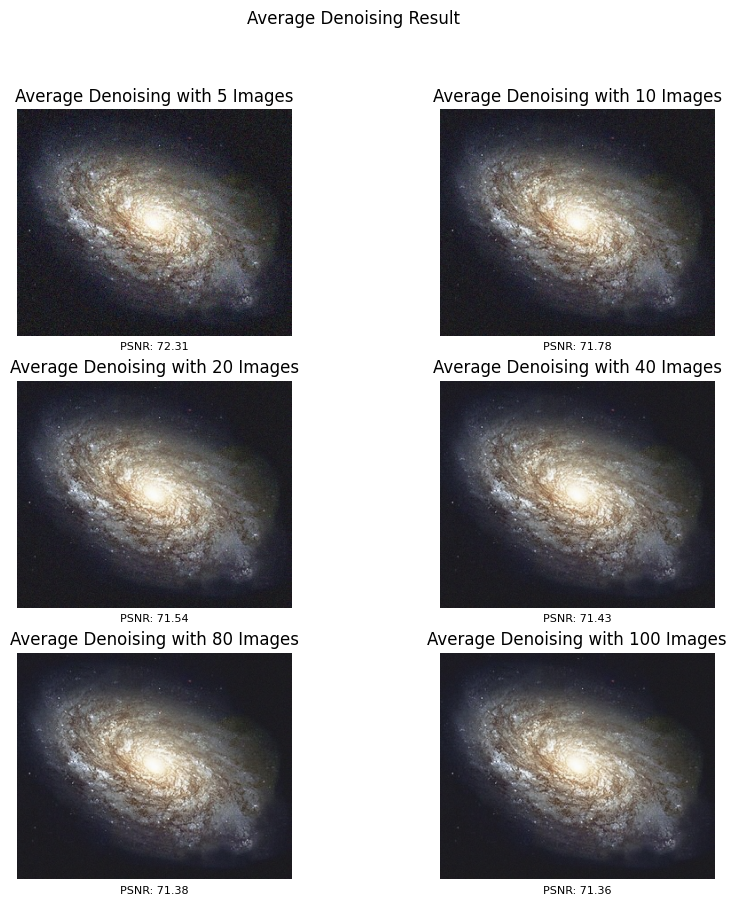

In [50]:
# represent in a table format
fig, axes = plt.subplots(ncols = 2, nrows = int(len(avg_count) / 2), figsize=(10, 10))

for i in range(1, len(avg_count) + 1):
  row = (i - 1) // 2
  col = (i - 1) % 2
  axes[row, col].imshow(result[i - 1][0])
  axes[row, col].set_title(f'Average Denoising with {avg_count[i - 1]} Images')
  axes[row, col].axis('off')
  axes[row, col].annotate(f"PSNR: {result[i-1][1]:.2f}",
                       xy=(0.5, 0), xycoords='axes fraction',
                       xytext=(0, -4), textcoords='offset points',
                       ha='center', va='top', fontsize=8)

fig.suptitle('Average Denoising Result')

The more image we add to the equation, the more "smooth" the result will be but less detail will be captured

In [92]:
ktp = cv.imread('/content/drive/MyDrive/PCVK/Images/KTP_More/KTP_More/ktp4.png')

def apply_mask(mask_fn):
  big_circular_mask = np.zeros(ktp.shape, dtype=np.uint8)
  cv.circle(big_circular_mask, (410, 130), 70, (255, 255, 255), -1)
  result = cv.hconcat([ktp, big_circular_mask, mask_fn(ktp, big_circular_mask)])
  cv2_imshow(result)

  nose_mask = np.zeros(ktp.shape, dtype=np.uint8)
  cv.circle(nose_mask, (410, 140), 15, (255, 255, 255), -1)
  result = cv.hconcat([ktp, nose_mask, mask_fn(ktp, nose_mask)])
  cv2_imshow(result)

  mouth_mask = np.zeros(ktp.shape, dtype=np.uint8)
  cv.circle(mouth_mask, (410, 160), 15, (255, 255, 255), -1)
  result = cv.hconcat([ktp, mouth_mask, mask_fn(ktp, mouth_mask)])
  cv2_imshow(result)

  eyes_mask = np.zeros(ktp.shape, dtype=np.uint8)
  cv.circle(eyes_mask, (390, 120), 15, (255, 255, 255), -1)
  cv.circle(eyes_mask, (430, 120), 15, (255, 255, 255), -1)
  result = cv.hconcat([ktp, eyes_mask, mask_fn(ktp, eyes_mask)])
  cv2_imshow(result)

  ears_mask = np.zeros(ktp.shape, dtype=np.uint8)
  cv.circle(ears_mask, (360, 140), 20, (255, 255, 255), -1)
  cv.circle(ears_mask, (450, 140), 20, (255, 255, 255), -1)
  result = cv.hconcat([ktp, ears_mask, mask_fn(ktp, ears_mask)])
  cv2_imshow(result)

# Bitwise NOT

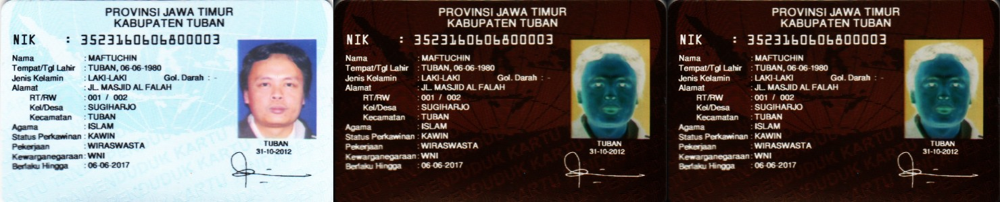

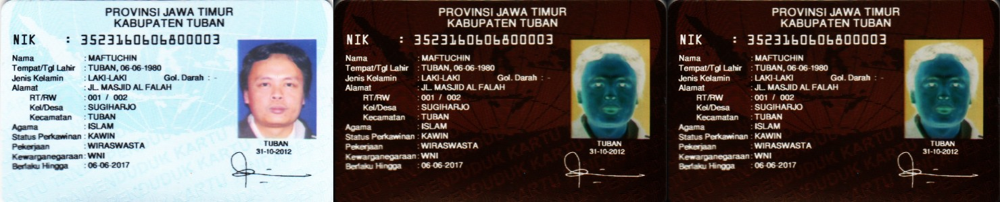

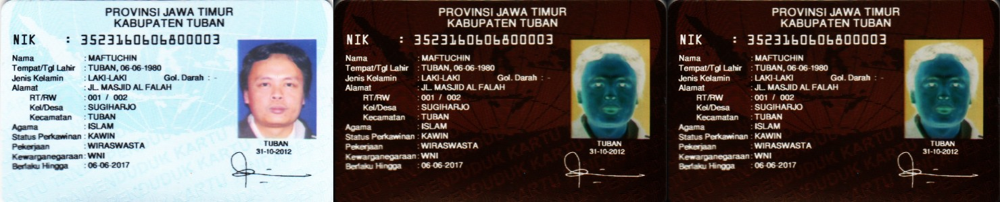

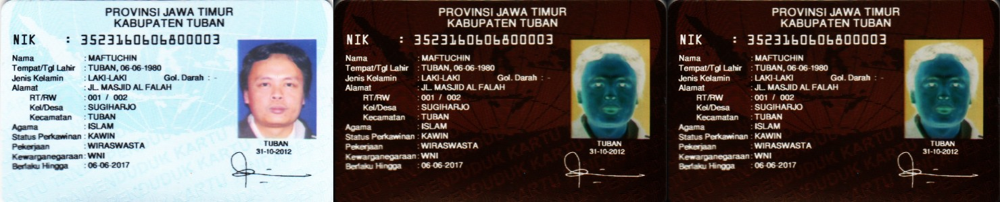

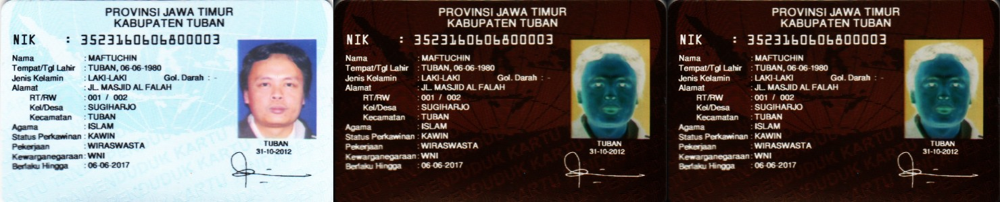

In [93]:
apply_mask(cv.bitwise_not)

# Bitwise OR

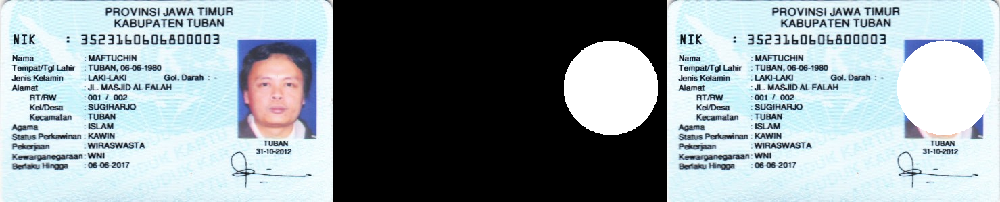

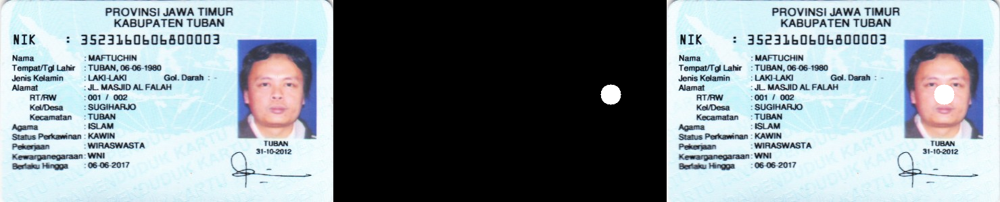

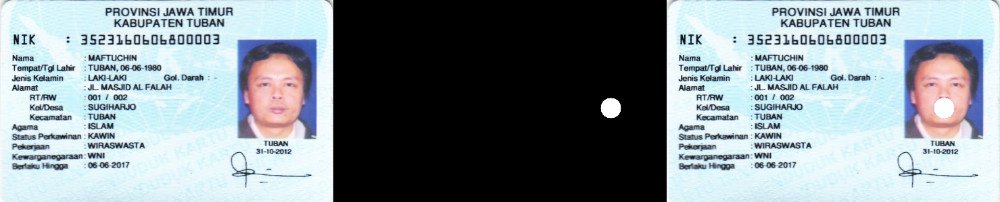

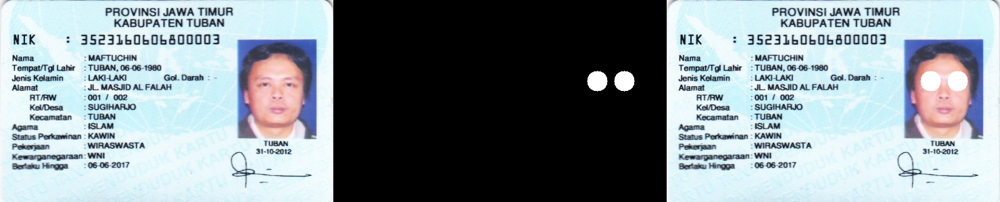

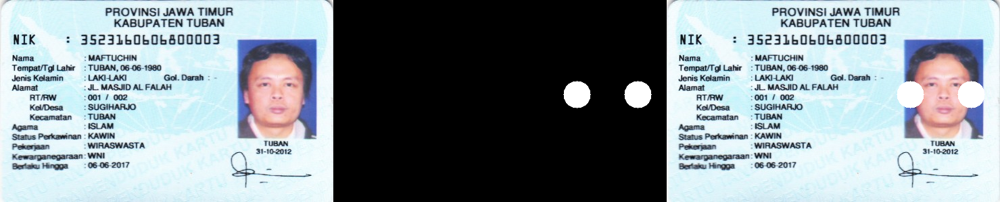

In [94]:
apply_mask(cv.bitwise_or)

# Bitwise AND

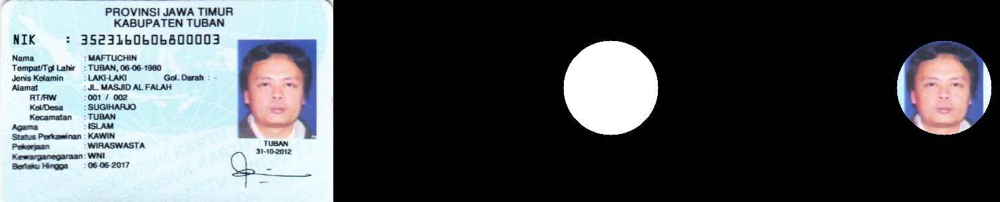

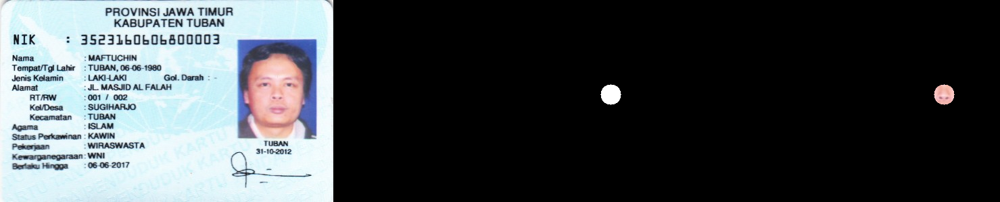

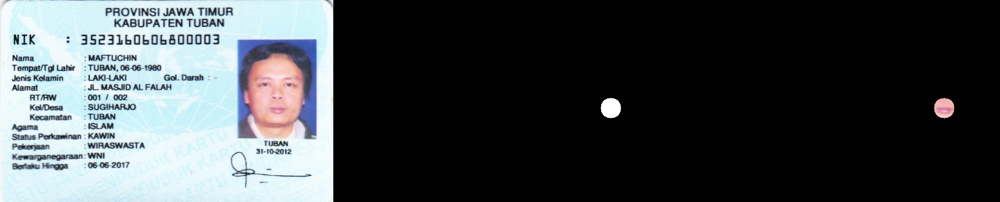

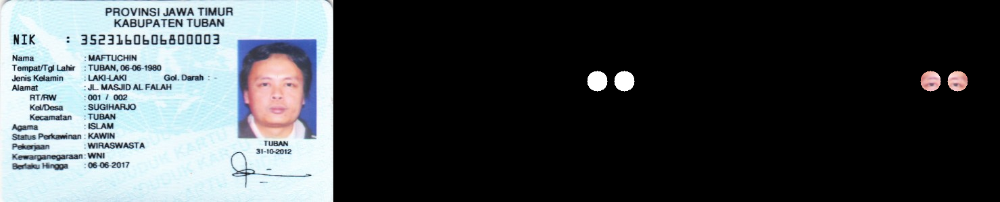

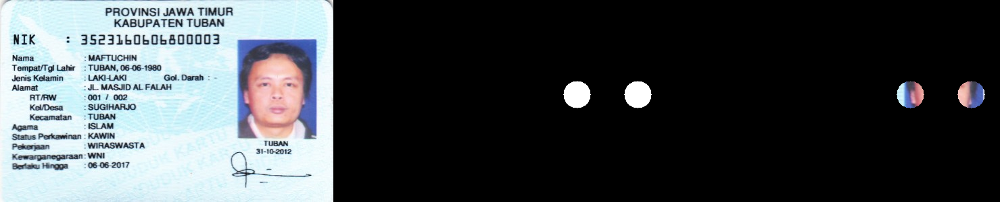

In [95]:
apply_mask(cv.bitwise_and)

# Bitwise NAND

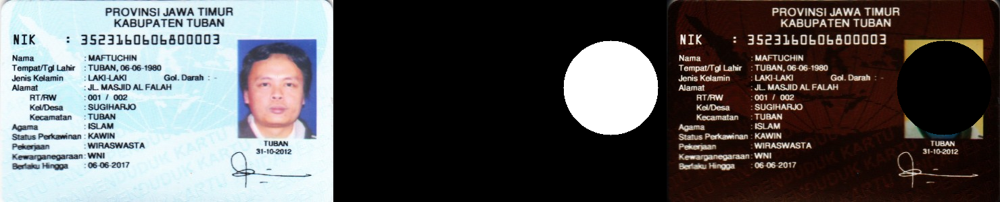

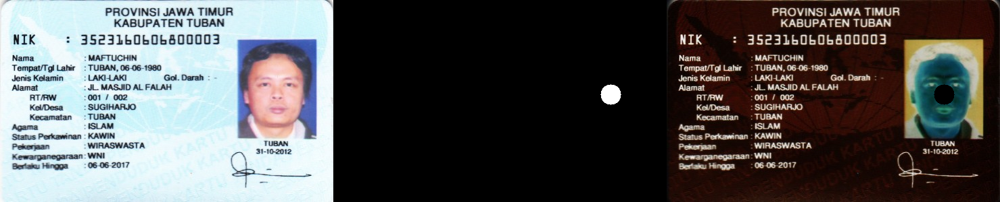

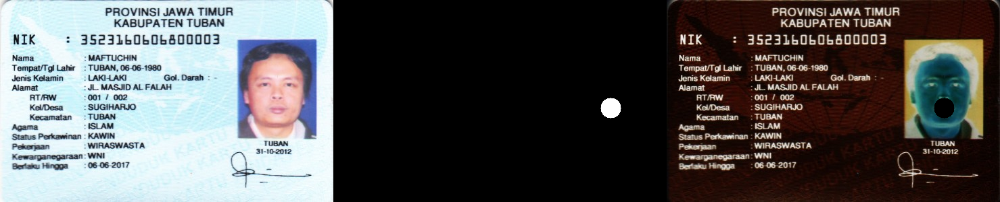

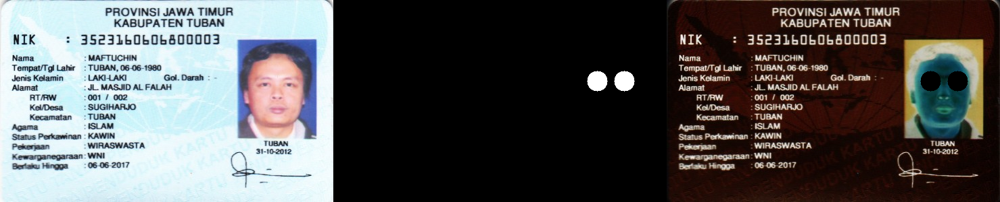

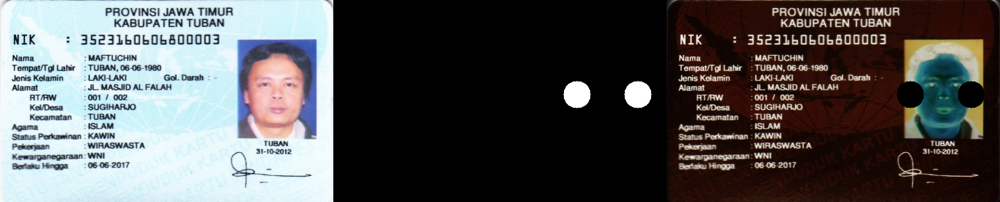

In [98]:
apply_mask(lambda img, mask: cv.bitwise_and(cv.bitwise_not(img), cv.bitwise_not(mask)))

# Bitwise XOR

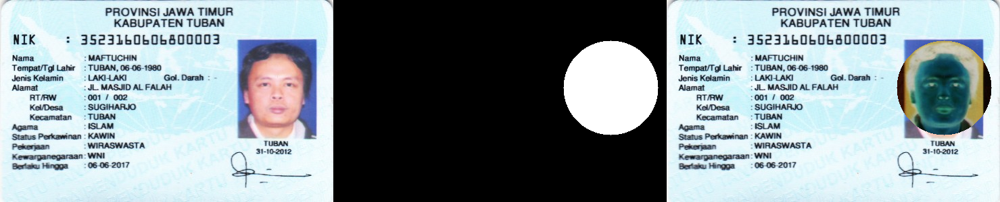

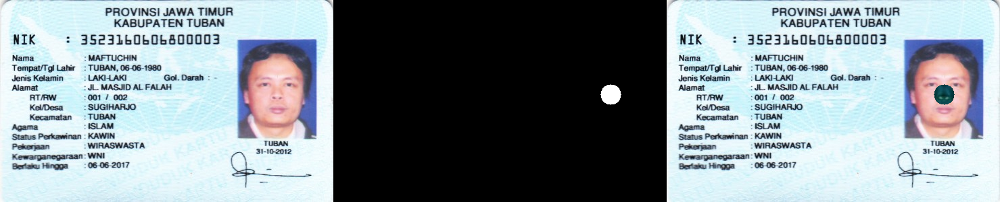

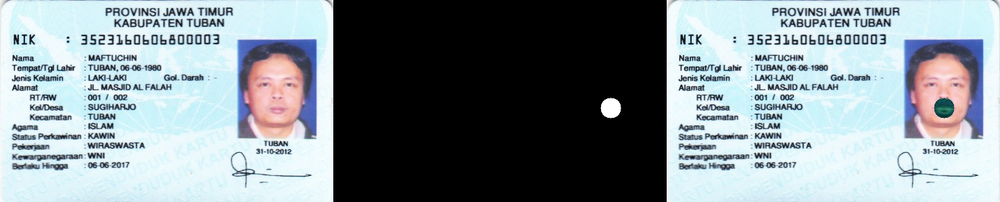

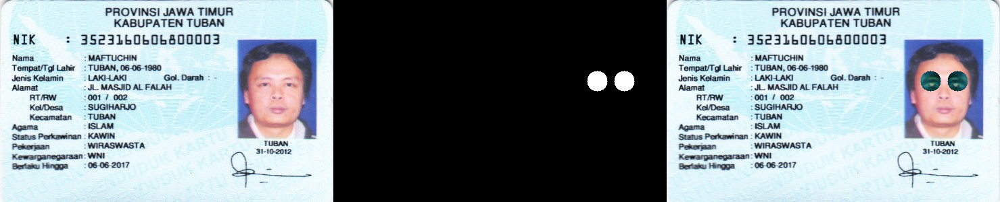

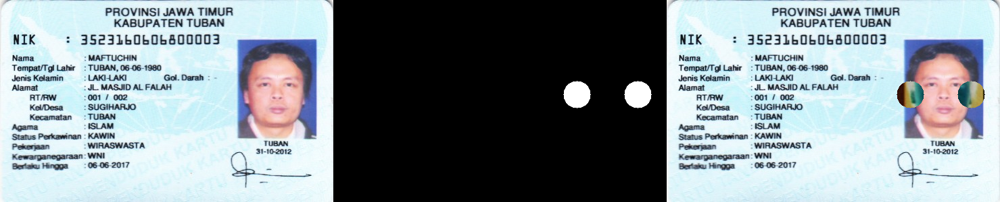

In [99]:
apply_mask(cv.bitwise_xor)